# Flippy Illusions

Hi! Welcome to the official colab demo for our demo "Diffusion Illusions: Hiding Images in Plain Sight". [https://ryanndagreat.github.io/Diffusion-Illusions/](https://ryanndagreat.github.io/Diffusion-Illusions/)

This project was inspired by our paper "Peekaboo: Text to Image Diffusion Models are Zero-Shot Segmentors". The Peekaboo project website: [https://ryanndagreat.github.io/peekaboo/](https://ryanndagreat.github.io/peekaboo/)

Instructions:

0. Go to the Runtime menu, and make sure this notebook is using GPU!
1. Run the top 2 code cells (one cleans colab's junk and downloads the source code, while the other installs python packages)
2. Click 'Runtime', then 'Restart Runtime'. You need to do this the first time you open this notebook to avoid weird random errors from the pip installations.
3. Run code cells to load stable diffusion. The first time you run it it will take a few minutes to download; subsequent times won't take long at all though.
4. Run all the cells below that, and customize prompt_a and prompt_b!
5. Take the result top_image and bottom_image, print them out, and shine a backlight through them like shown in the Diffusion Illusion website (link above!)

I may also create a YouTube tutorial if there's interest. Let me know if this would be helpful!

This notebook was written by Ryan Burgert. Feel free to reach out to me at rburgert@cs.stonybrook.edu if you have any questions! 

In [ ]:
%%bash
if [ ! -d ".git" ]; then 
    rm -rf * .*; #Get rid of Colab's default junk files
    git clone -b master https://github.com/RyannDaGreat/Diffusion-Illusions .
fi

In [ ]:
%pip install --upgrade -r requirements.txt
%pip install rp --upgrade
# You may need to restart the runtime after installing these
# I'm not sure why this helps, but all sorts of weird random errors pop up in Colab if you don't

In [1]:
import numpy as np
import rp
import torch
import torch.nn as nn
import source.stable_diffusion_new as sd
from easydict import EasyDict
from source.learnable_textures import LearnableImageFourier
from source.stable_diffusion_labels import NegativeLabel
from itertools import chain
import time

/root/miniconda3/envs/Diff/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [2]:
#ONLY GOOD PROMPTS HERE
example_prompts = rp.load_yaml_file('source/example_prompts.yaml')
print('Available example prompts:', ', '.join(example_prompts))

#These prompts are all strings - you can replace them with whatever you want! By default it lets you choose from example prompts
#Here are some on the site! It does take some thought to come up with good ideas; the upside-down should look vaguely like the right-side up to work nicely
prompt_a, prompt_b = rp.gather(example_prompts, 'victorial_dress victorial_dress'.split())
prompt_a, prompt_b = rp.gather(example_prompts, 'pencil_penguin pencil_giraffe_head'.split())
# prompt_a, prompt_b = rp.gather(example_prompts, 'sailing_ship sailing_ship'.split())

negative_prompt = ''

print()
print('Negative prompt:',repr(negative_prompt))
print()
print('Chosen prompts:')
print('    prompt_a =', repr(prompt_a)) #This will be right-side up
print('    prompt_b =', repr(prompt_b)) #This will be upside-down

Available example prompts: kitten_in_box, botw_landscape, magic_emma_watson, yorkshire_terrier_santa, norwegian_winter_girl, magic_forest_temple, sailing_ship, bioshock_lighthouse, two_bunnys_hugging, thomas_tank_military, wolf_on_rock, victorial_dress, lolita_dress_magical_elf, pencil_giraffe_head, pencil_penguin, pencil_violin, pencil_orca_whale, pencil_cow, pencil_walrus, pencil_cat_head, pencil_dog_head, ape_with_gun, human_skeleton, gold_coins, golf_ball_in_forest, bear_in_forest, elephant_in_circus, mickey_mouse, mushroom, mario, burger, darth_vader, gandalf, fantasy_city, green_elf_girl, pikachu, spring, fall, winter, summer, miku, pyramids, dinosaur, lipstick, picard, bull_wing, froggo, assasin_creed, moon, minecraft_zombie, pistol, disco_ball, volcano, porche, hawaii_beach, walter_white, dalek, tardis, tennant, weeping_angel

Negative prompt: ''

Chosen prompts:
    prompt_a = 'an intricate detailed hb pencil sketch of a penguin'
    prompt_b = 'an intricate detailed hb pencil

# New Section

In [3]:
if 's' not in dir():
    # model_name="CompVis/stable-diffusion-v1-4"
    model_name="/root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4"
    gpu='cuda:0'
    s=sd.StableDiffusion(gpu,model_name)
device=s.device

[INFO] sd.py: loading stable diffusion...please make sure you have run `huggingface-cli login`.


Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 34.12it/s]


[INFO] sd.py: loaded stable diffusion!


In [18]:
label_a = NegativeLabel(prompt_a,negative_prompt)
label_b = NegativeLabel(prompt_b,negative_prompt)

In [19]:
# ================= 1. 准备参考图片 =================
# 假设你想让“倒过来的图 (Image B)”长得像这张图
from PIL import Image
SIZE = 256  # 训练尺寸，256 或 512
target_path = "target.png"  # 请上传图片到左侧文件栏，并修改此处文件名

pil_image = Image.open(target_path).convert('RGB')
pil_image = pil_image.resize((SIZE, SIZE), Image.Resampling.LANCZOS)

# 2. 转为 Numpy 数组
target_img_numpy = np.array(pil_image)

# 3. 转为 Tensor (使用 rp 现有的工具)
target_tensor = rp.as_torch_image(target_img_numpy).to(device)

print("图片加载成功 (使用 PIL)")
# =================================================

图片加载成功 (使用 PIL)


In [20]:
#Image Parametrization and Initialization (this section takes vram)

#Select Learnable Image Size (this has big VRAM implications!):
#Note: We use implicit neural representations for better image quality
#They're previously used in our paper "TRITON: Neural Neural Textures make Sim2Real Consistent" (see tritonpaper.github.io)
# ... and that representation is based on Fourier Feature Networks (see bmild.github.io/fourfeat)
learnable_image_maker = lambda: LearnableImageFourier(height=256, width=256, hidden_dim=256, num_features=128).to(s.device); SIZE=256
# learnable_image_maker = lambda: LearnableImageFourier(height=512,width=512,num_features=256,hidden_dim=256,scale=20).to(s.device);SIZE=512

image=learnable_image_maker()

In [21]:
learnable_image_a=lambda: image() #Right-side up
learnable_image_b=lambda: image().rot90(k=2,dims=[1,2]) #Upside-down

optim=torch.optim.SGD(image.parameters(),lr=1e-4)

In [22]:
labels=[label_a,label_b]
learnable_images=[learnable_image_a,learnable_image_b]

#The weight coefficients for each prompt. For example, if we have [0,1], then only the upside-down mode will be optimized
weights=[1,1]

weights=rp.as_numpy_array(weights)
weights=weights/weights.sum()
weights=weights*len(weights)

In [23]:
#For saving a timelapse
ims=[]

In [24]:
def get_display_image():
    return rp.tiled_images(
        [
            rp.as_numpy_image(learnable_image_a()),
            rp.as_numpy_image(learnable_image_b()),
        ],
        length=len(learnable_images),
        border_thickness=0,
    )

Every 200 iterations we display an image in the form [image_a, image_b], where
    image_a = (the right-side up image)
    image_b = (image_a, but upside down)

Interrupt the kernel at any time to return the currently displayed image
You can run this cell again to resume training later on

Please expect this to take quite a while to get good images (especially on the slower Colab GPU's)! The longer you wait the better they'll be


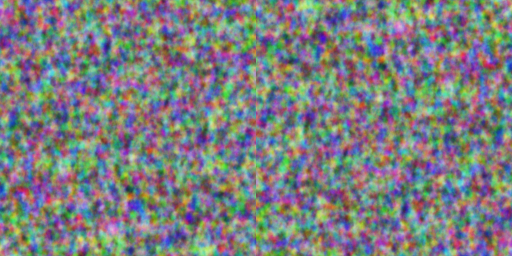

Status: ETR=0:37:26.508532      ETA=0:38:12.355645      T=0:00:45.847113        Progress: 200/10000     RATE=4.36/s

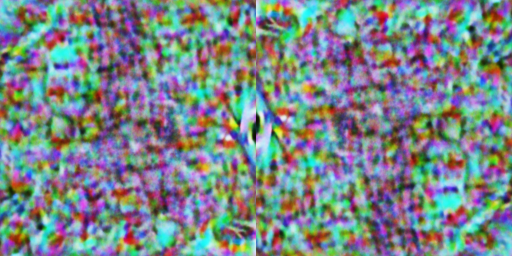

Status: ETR=0:36:43.922235      ETA=0:38:15.752329      T=0:01:31.830093        Progress: 400/10000     RATE=4.36/s

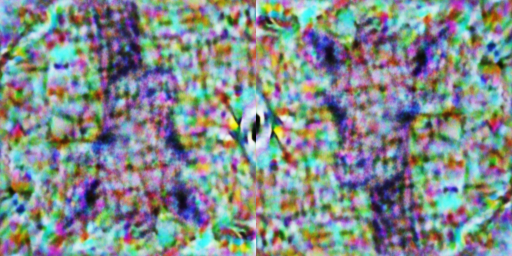

Status: ETR=0:35:38.398663      ETA=0:37:54.892195      T=0:02:16.493532        Progress: 600/10000     RATE=4.40/s

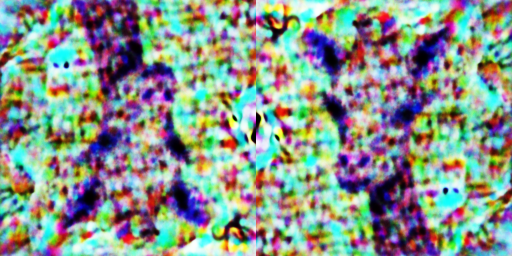

Status: ETR=0:34:41.741005      ETA=0:37:42.761962      T=0:03:01.020957        Progress: 800/10000     RATE=4.42/s

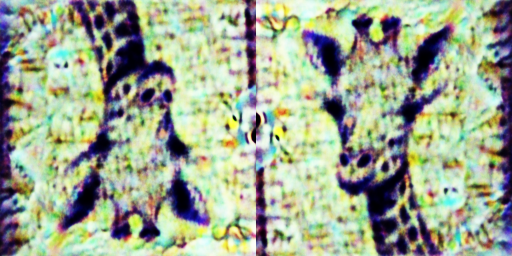

Status: ETR=0:34:04.952828      ETA=0:37:52.169809      T=0:03:47.216981        Progress: 1000/10000    RATE=4.40/s

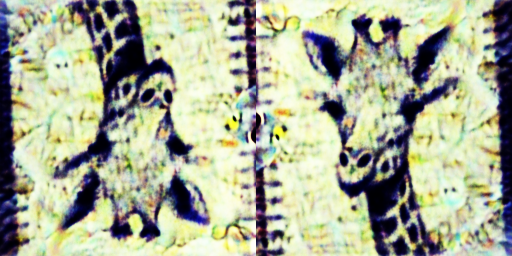

Status: ETR=0:33:10.104375      ETA=0:37:41.482245      T=0:04:31.377869        Progress: 1200/10000    RATE=4.42/s

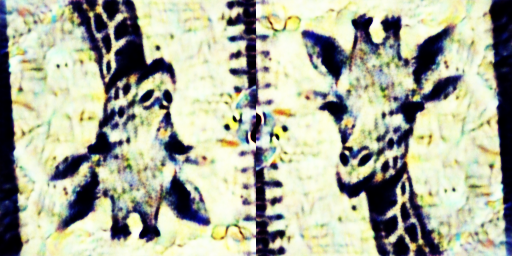

Status: ETR=0:32:20.958911      ETA=0:37:36.928967      T=0:05:15.970055        Progress: 1400/10000    RATE=4.43/s

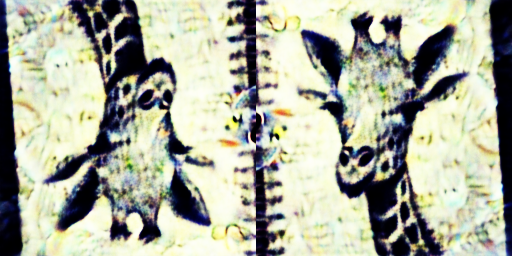

Status: ETR=0:31:46.421096      ETA=0:37:49.548924      T=0:06:03.127828        Progress: 1600/10000    RATE=4.41/s

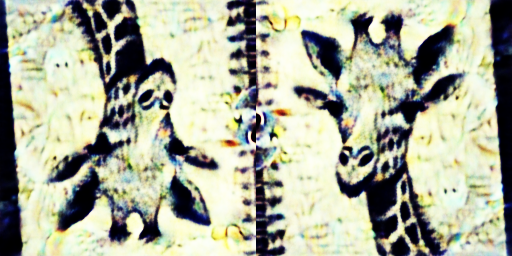

Status: ETR=0:31:21.042605      ETA=0:38:13.954396      T=0:06:52.911791        Progress: 1800/10000    RATE=4.36/s

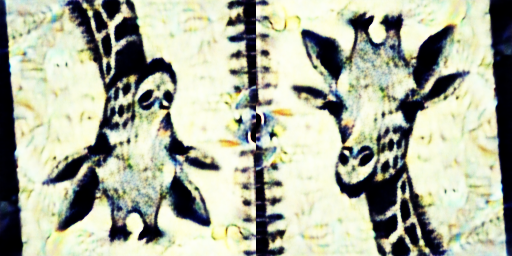

Status: ETR=0:30:33.809465      ETA=0:38:12.261832      T=0:07:38.452366        Progress: 2000/10000    RATE=4.36/s

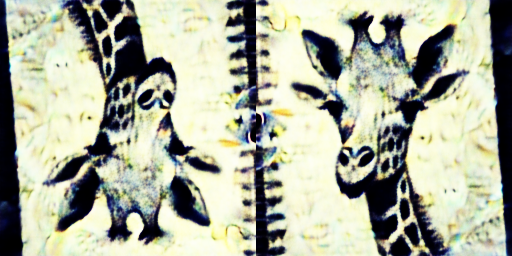

Status: ETR=0:29:45.987508      ETA=0:38:09.727574      T=0:08:23.740066        Progress: 2200/10000    RATE=4.37/s

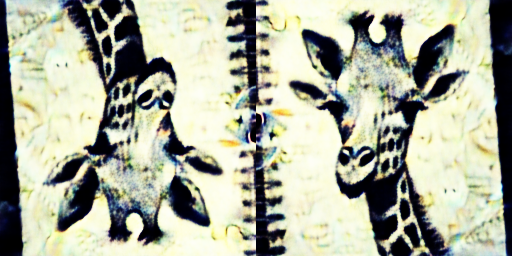

Status: ETR=0:28:58.598023      ETA=0:38:07.628977      T=0:09:09.030955        Progress: 2400/10000    RATE=4.37/s

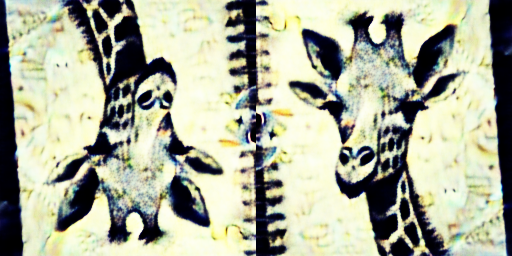

Status: ETR=0:28:09.276835      ETA=0:38:02.806533      T=0:09:53.529699        Progress: 2600/10000    RATE=4.38/s

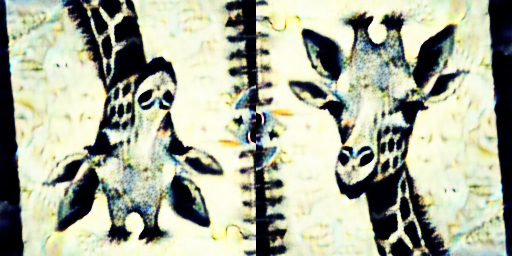

Status: ETR=0:27:24.586961      ETA=0:38:04.148557      T=0:10:39.561596        Progress: 2800/10000    RATE=4.38/s

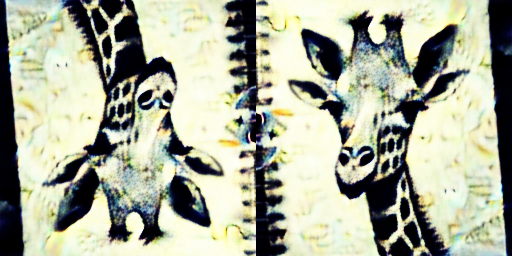

Status: ETR=0:26:38.473258      ETA=0:38:03.533226      T=0:11:25.059968        Progress: 3000/10000    RATE=4.38/s

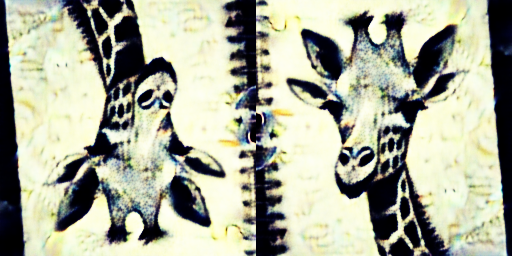

Status: ETR=0:25:51.676555      ETA=0:38:01.877287      T=0:12:10.200732        Progress: 3200/10000    RATE=4.38/s

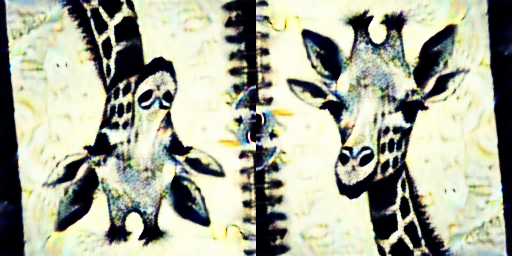

Status: ETR=0:25:07.534920      ETA=0:38:04.143817      T=0:12:56.608898        Progress: 3400/10000    RATE=4.38/s

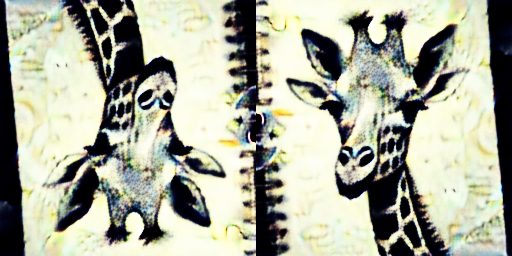

Status: ETR=0:24:19.286329      ETA=0:38:00.134888      T=0:13:40.848560        Progress: 3600/10000    RATE=4.39/s

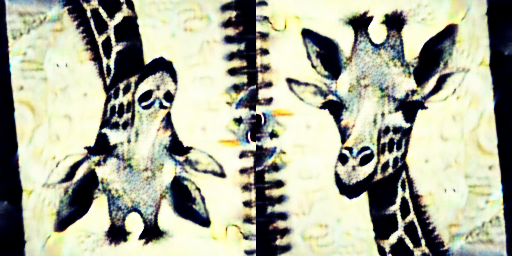

Status: ETR=0:23:31.840160      ETA=0:37:57.161548      T=0:14:25.321388        Progress: 3800/10000    RATE=4.39/s

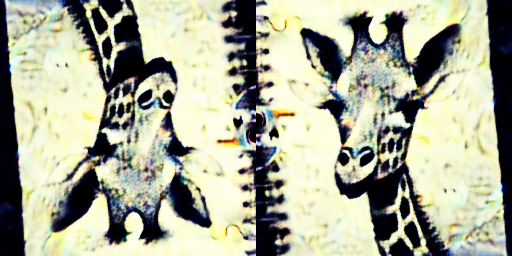

Status: ETR=0:22:50.086876      ETA=0:38:03.478127      T=0:15:13.391251        Progress: 4000/10000    RATE=4.38/s

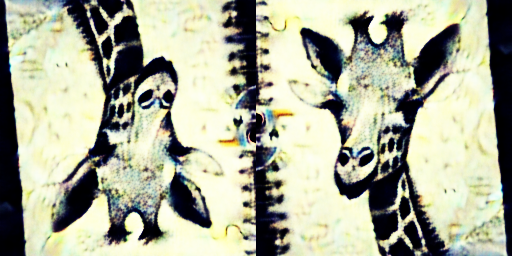

Status: ETR=0:22:03.016646      ETA=0:38:01.063182      T=0:15:58.046536        Progress: 4200/10000    RATE=4.38/s

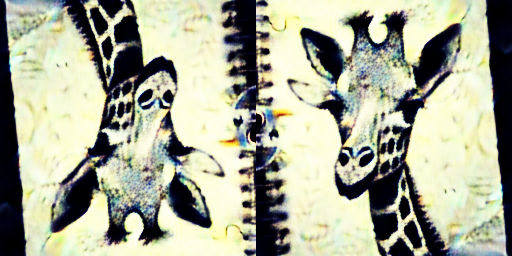

Status: ETR=0:21:19.439692      ETA=0:38:04.713736      T=0:16:45.274044        Progress: 4400/10000    RATE=4.38/s

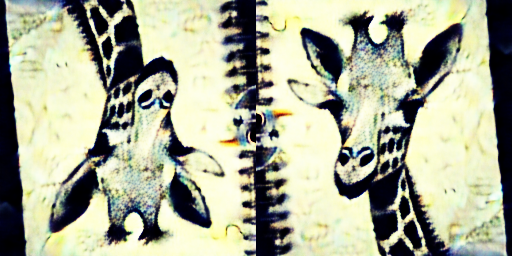

Status: ETR=0:20:35.037396      ETA=0:38:07.106290      T=0:17:32.068893        Progress: 4600/10000    RATE=4.37/s

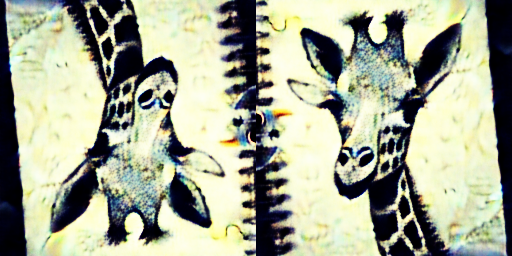

Status: ETR=0:19:50.572825      ETA=0:38:09.563125      T=0:18:18.990300        Progress: 4800/10000    RATE=4.37/s

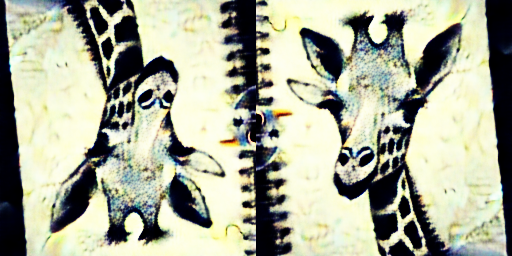

Status: ETR=0:19:34.741751      ETA=0:38:13.073885      T=0:18:38.332134        Progress: 4877/10000    RATE=4.36/s
Interrupted early at iteration 4877


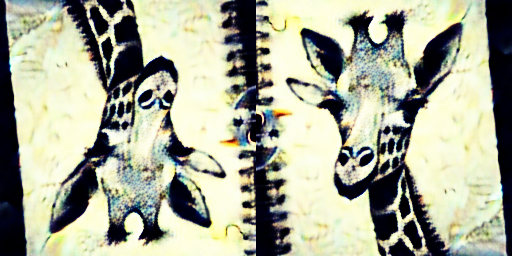

In [25]:
# # ==========================================
# # 核心修复 1: 预训练 (Pre-training / Warm Start)
# # 这一步至关重要！它解决了“纹理乱飘”的问题。
# # ==========================================
# if 'target_tensor' in locals() and target_tensor is not None:
#     print("🚀 正在进行预训练：将画布初始化为目标图片结构...")
#     # 使用一个临时优化器，快速把画面变成目标图
#     pre_optim = torch.optim.Adam(image.parameters(), lr=0.01)
#     target_tensor = target_tensor.float()
#     # 跑 500 步，让 learnable_image_b (倒视图) 变成 target_tensor (鹿)
#     for i in range(500):
#         pre_optim.zero_grad()
        
#         # 获取倒视图
#         # 如果你想让正视图像，改成 learnable_image_a()
#         current_view = learnable_image_a()
        
#         # 计算像素差异
#         loss = torch.nn.functional.mse_loss(current_view, target_tensor)
        
#         loss.backward()
#         pre_optim.step()
        
#         if i % 100 == 0:
#             print(f"    预训练进度 {i}/500, Loss: {loss.item():.5f}")
            
#     print("✅ 预训练完成！画布已初始化。清理梯度，开始正式错觉生成...")
#     optim.zero_grad() # 清理掉预训练的梯度
#     del pre_optim     # 删除临时优化器
# # ==========================================

NUM_ITER=10000

#Set the minimum and maximum noise timesteps for the dream loss (aka score distillation loss)
s.max_step=MAX_STEP=990
s.min_step=MIN_STEP=10 

display_eta=rp.eta(NUM_ITER, title='Status')

DISPLAY_INTERVAL = 200

print('Every %i iterations we display an image in the form [image_a, image_b], where'%DISPLAY_INTERVAL)
print('    image_a = (the right-side up image)')
print('    image_b = (image_a, but upside down)')
print()
print('Interrupt the kernel at any time to return the currently displayed image')
print('You can run this cell again to resume training later on')
print()
print('Please expect this to take quite a while to get good images (especially on the slower Colab GPU\'s)! The longer you wait the better they\'ll be')

try:
    for iter_num in range(NUM_ITER):
        display_eta(iter_num) #Print the remaining time

        preds=[]
        for label,learnable_image,weight in rp.random_batch(list(zip(labels,learnable_images,weights)), batch_size=1):
            # ================= 2. 设置图片约束参数 =================
            current_clip_target = None
            current_clip_coef = 0
            current_guidance_scale = 60
            # 判断当前是在训练哪一张图
            # learnable_images[0] 是正视图 (Prompt A)
            # learnable_images[1] 是倒视图 (Prompt B)
            
            # 想让“倒视图”像参考图，如果想让“正视图”像参考图，就把上面改成 == learnable_images[0]
            if target_tensor is not None and learnable_image == learnable_images[0]:
                current_guidance_scale = 50
                current_clip_target = target_tensor
                current_clip_coef = 5000 # <--- 核心超参：CLIP 强度。建议 1000-5000 之间尝试
        
            # =====================================================
            
            pred=s.train_step(
                label.embedding,
                learnable_image()[None],

                #PRESETS (uncomment one):
                noise_coef=.1*weight,guidance_scale=current_guidance_scale,#10
                # noise_coef=0,image_coef=-.01,guidance_scale=50,
                # noise_coef=0,image_coef=-.005,guidance_scale=50,
                # noise_coef=.1,image_coef=-.010,guidance_scale=50,
                # noise_coef=.1,image_coef=-.005,guidance_scale=50,
                # noise_coef=.1*weight, image_coef=-.005*weight, guidance_scale=50,
                clip_image_target=current_clip_target, # 传入目标图片 Tensor
                clip_image_coef=current_clip_coef      # 传入权重，0 代表不启用
            )
            preds+=list(pred)

        with torch.no_grad():
            if iter_num and not iter_num%(DISPLAY_INTERVAL*50):
                #Wipe the slate every 50 displays so they don't get cut off
                from IPython.display import clear_output
                clear_output()

            if not iter_num%DISPLAY_INTERVAL:
                im = get_display_image()
                ims.append(im)
                rp.display_image(im)

        optim.step()
        optim.zero_grad()
except KeyboardInterrupt:
    print()
    print('Interrupted early at iteration %i'%iter_num)
    im = get_display_image()
    ims.append(im)
    rp.display_image(im)

Right-side up image:


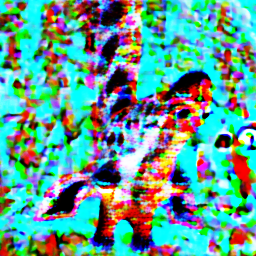

Upside-down image:


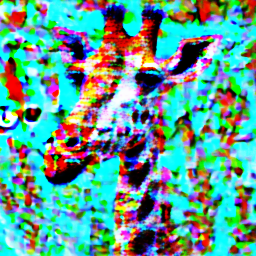

In [12]:
print('Right-side up image:')
rp.display_image(rp.as_numpy_image(learnable_image_a()))

print('Upside-down image:')
rp.display_image(rp.as_numpy_image(learnable_image_b()))

In [13]:
def save_run(name):
    folder="untracked/flippy_illusion_runs/%s"%name
    if rp.path_exists(folder):
        folder+='_%i'%time.time()
    rp.make_directory(folder)
    ims_names=['ims_%04i.png'%i for i in range(len(ims))]
    with rp.SetCurrentDirectoryTemporarily(folder):
        rp.save_images(ims,ims_names,show_progress=True)
    print()
    print('Saved timelapse to folder:',repr(folder))
    
save_run('-'.join([prompt_a,prompt_b])) #You can give it a good custom name if you want!

Saving Images: Done! Did 50 items in 0:00:00.359440                                                                                  
rp.save_images: Done! Saved 50 images in 0.364 seconds

Saved timelapse to folder: 'untracked/flippy_illusion_runs/an intricate detailed hb pencil sketch of a penguin-an intricate detailed hb pencil sketch of a giraffe head'
